# Exercise 7

## physics718: Programming in Physics and Astronomy with C++ or Python (SS 2020)
Oliver Cordes & Thomas Erben

Homework is due on **Friday, 26/06/2020, 23:59pm**

 * You only learn a programming language by actively praticing and using it! We therefore **strongly** advise you to work on the homework problems.
 * Please discuss the problems with your student peers in case of problems.
 * Your code(s) needs to be well and appropriately commented!
 * All files of your solution should be in the same directory as this notebook including scripts, images, additional notebooks etc.
 * References to files in scripts and notebooks should be done with relative paths
 * Finally submit this notebook with your solutions in the nbgrader system
 
**Main topics of this exercise:**
 * discrete fourier transformations on *numpy* arrays 
 * animations with matplotlib

Put in here your group number: 

Group 26

Since we have a discussion about the workload of homework exercises and projects, we need some feedback. Please write the amount of time you have spent for this homework, including repition of tutorial sessions exercises and videos for each person of your group.

Spent time: 
 * Member 1: 1 hours
 * Member 2: 1 hours
 * Member 3: 1 hours
 
Please don't write your names! We just need the amount of hours!

# Before you start ...

In this exercise you need to prepare some plots. Now that you have experiences in using the *matplotlib* functions please create good plots, which includes proper styles/colors, labels, legends, ticks etc. During the grading we will also check the plot style not only the data which was plotted.

# MP3 files and discrete fourier transformations

As you probably know music on digital media are in most cases compressed data. The prominent compressed file format is the *MP3* format which was developed in 1982 at the Fraunhofer-Institut für Integrierte Schaltungen (IIS) in Erlangen. With only some parameters you can reach a good compression rate by roughly 10:1. The mechanism of the compression is to store only frequencies of the music which are recognizable by the human ear. For example human speech has a limited spectrum of frequencies up to 4 kHz, whereas music today is recorded with 48 kHz. In a MP3 file only frequencies up to an limit are stored. However, there are also more additional algorithms in which frequencies are stored until a specified bandwidth is reached. To illustrate this you can listen to some example music which is very prominent. It is the Star Wars Theme from 1978:

 * the original CD version (44.1 kHz stereo) <br>
    <audio controls src="cdda.wav" type="audio/wav">Your browser does not support the audio tag.</audio>
 * the compressed MP3 version (44.1 kHz stereo, 96kbit bandwith limit, constant bitrate) <br>
    <audio controls src="cdda.mp3" type="audio/mpeg">Your browser does not support the audio tag.</audio>

If you listen to both examples, you may hear some differences, but in most environments and depending of the quality of your speaker both are mostly similar (don't blame me for this!).

However, if we have a look at the frequency spectrum of both audio formats we can see that in the MP3 file, all frequencies larger as 15.4kHz are cut of. (Both images show the amplitudes for each frequency up to 22.5kHz, the range of $y$ values is limited to show the differences!).

<table>
    <tr>
        <td><img src="fft_spec_wav.png" /></td>
        <td><img src="fft_spec_mp3.png" /></td>
    </tr>
</table>

The frequency which are displayed in the both plot are calculated with the discrete fourier transformation which is the topic of this exercise.

## Audio output in jupyterlab

In this exercise we are working with audio signals and sound. Having a sound system attached to your computer is very useful. If you only have mobile devices this is also working, since you can login into the jupyterlab environment using mobile devices.

The jupyterlab environment in particular IPython which is working in the background is able to play *numpy* arrays directly as sound streams. So see this first example, in which we create a *numpy* array with a 440 Hz mono signal for 2 seconds. The array is then played with a sample frequency of 44.1kHz:

In [1]:
import numpy as np   # as usual

# the object Audio is a widget, which is able to play sound data
from IPython.display import Audio


# create a 440 Hz tone

freq = 440
sample_time = 2                  #  length of the sample in seconds
sample_len = 44100*sample_time   #  we are calculating everything for 44.1 kHz output

# calculate an array with the number of full periods from 0 to 2*pi 
# for the complete length of the samples
mono_data = np.sin(np.linspace(0,2*np.pi*freq*sample_time, sample_len))

# create the audio player widget
Audio(mono_data,rate=44100)

The Audio widget can also play 2 dimensional array which are then the left and right audio channel. The following example creates a nice overlap of the base frequency in which the left frequency is 0.5% smaller and the right frequency 0.5% higher. This creates a better sound feeling for the base frequency of 440 Hz. In the following tasks we will focus only on mono signals: 

In [2]:
import numpy as np   # as usual

# the object Audio is a widget, which is able to play sound data
from IPython.display import Audio


# create a 440 Hz tone

freq = 440
sample_time = 2                  #  length of the sample in seconds
sample_len = 44100*sample_time   #  we are calculating everything for 44.1 kHz output

# create a left and right 
left_data = np.sin(np.linspace(0,2*np.pi*freq*0.995*sample_time, sample_len))
right_data = np.sin(np.linspace(0,2*np.pi*freq*1.005*sample_time, sample_len))

stereo_data = np.array([left_data, right_data])

Audio(stereo_data, rate=44100)

The widget is calculating the loudness automatically from the data array. So for simply listening to the data we don't need to adjust or normalize the arrays.

## 1. Discrete fourier transformation (DTF)

The discrete fourier transformation (DTF) is working on a sequence of $N$ numbers $x=(x_{0},...,x_{N-1})$ which defines the signal and can be measurements from an experiment. One assumes, that the numbers standing for a period of a periodical signal. The DTF is also defined on a series of complex numbers.

The result of the transformation is a decomposition of the series in sinusoidal parts $X =(X_0,...,X_{N-1})$, whereas the constant $X_0$ describes the  mean average of the signal. 

The coefficients can be calculated with:

$$ X_k = \sum_{j=0}^{N-1} \textrm{e}^{-2\pi \textrm{i} \cdot \frac{jk}{N}}\cdot x_{j}$$

or in the polar notation  ${\mathrm {e} ^{\mathrm {i} \,\phi }=\cos \left(\phi \right)+\mathrm {i} \,\sin \left(\phi \right)}$:

$$ X_k = \sum_{j=0}^{N-1} x_j \left[\cos \left({\frac {2\pi }{N}}kn\right)-i\cdot \sin \left({\frac {2\pi }{N}}kn\right)\right] $$

The first coefficient $X_0$ is always the sum of the values of the input numbers:

$$X_0 = \sum_{j=0}^{N-1} x_j $$.

The inverse discrete fourier transformation (IDTF) is defined as:

$$ x_k = \frac{1}{N} \sum _{j=0}^{N-1}e^{2\pi \mathrm {i} \cdot {\frac {jk}{N}}}\cdot X_j $$

In the case that $N$ is even, the coefficients $X_1,...,X_{N/2-1}$ contain the positive-frequency terms, and the coefficients $X_{N/2},...,X_{N-1}$  contain the negative-frequency terms, in order of decreasingly negative frequency. If $N$ is odd, the coefficients $X_1,...,X_{(N-1)/2}$  contain the positive-frequency terms, and the elements $X_{(N-1)/2},...,X_{N-1}$  contain the negative-frequency terms, in order of decreasingly negative frequency.

If the sequence $x$ has only real values, the values of $X_i$ for positive frequencies is the conjugate of the values $X_i$ for negative frequencies (because the spectrum is symmetric). Typically, only the fourier coefficients corresponding to positive frequencies are plotted.

The fourier coefficients can be used for different purposes. For any periodic signals which are combinations of sinusoidal functions you can calculate the frequencies and amplitudes of these individual functions. Also you can use the coefficients to filter signals from a broader signal, reduce noisy signals etc. 

For the fourier coefficients which are calculated are complex numbers, even if the sequence $x$ has only real values. In Python a complex number can be written like that:

In [3]:
x = 1.0          # a real value
c = 1.0 + 1.0j   # a complex number

print(c)
print(c.real)    # print the real part of the number
print(c.imag)    # print the imaginary part of the number
print(np.abs(c)) # print the power of c which is np.sqrt(c.real**2+c.imag**2)

(1+1j)
1.0
1.0
1.4142135623730951


For plotting of the positive frequencies the power of the complex numbers are used.

## Task 1. Implementing the simple DTF algorithm (20 Points)

**Your task**:

Implement the fourier transformation in a python cell, without using the fft function defined in the *numpy* or *scipy* module. Define a function *rfft* which takes the sequence $x$ as an argument. It should return only the positive frequencies of the fourier transform of $x$ as a *numpy* array. Don't use loops for the calculations, you can make usage of the *np.meshgrid* function!

Define a sequence (1d array) of 5000 samples in which you define a signal of 400Hz with an amplitude of 10., which means 400 complete periods for the whole array. 
Test your function and plot the results. Calculate the position of the 400Hz frequency and mark the position with a vertical line with *plt.vlines*! Create a second plot in which you create the same signal of 400Hz plus a second signal of 2000Hz with an amplitude of 5. 


**Hints**:
 * when you start coding write the calculation first with loops, then try to optimize the calculations with a meshgrid for the input sequence and the $k$-index for the fourier coefficient series
 * to compare the amplitudes with real values, the coefficients can be scaled by the number of samples of the input sequence. 

Text(0.5, 1.0, 'fourier tranform for 400 Hz tone')

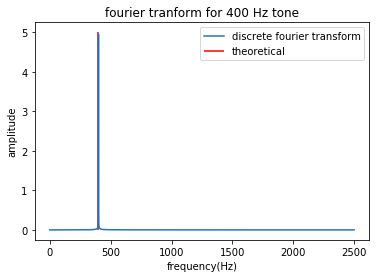

In [4]:
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np

#define a fourier transform function that takes an array x and produces a complex array,
#which are the coefficients of the non-negative frequencies. 
def rfft(x):
    
    # YOUR CODE HERE
    
    #the length of x
    N=len(x)
    
    #an array from 0 to N-1
    index_x=np.arange(N)
    
    #determine the length of the output
    
    #if N is even
    if N%2==0:
        
        #output length is N/2+1
        index_y=np.arange(N//2+1)
    else:
        
        #if N is odd, output length is (N+1)/2
        index_y=np.arange((N+1)//2)
        
    #mesh grid the indexing of input and output
    xx,yy=np.meshgrid(index_x,index_y)
    
    #apply function on the grid
    
    #real part of the exponential. A 2-d array
    cos=np.cos(-2*np.pi*xx*yy/N)
    
    #imaginary part of the exponential. A 2-d array
    sin=np.sin(-2*np.pi*xx*yy/N)
    
    #real part of the output array. We broadcasted the 1-d array x to 2-d to match the size of the 2-d array cos
    real=np.sum(cos*x,axis=1)
    
    #imaginary partof the output array. We broadcasted the 1-d array x to 2-d to match the size of the 2-d array sin
    imaginary=-np.sum(sin*x,axis=1)
    
    #combine both to obtain an array with complex numbers
    fourier=real+imaginary*1j
    
    return fourier


# create a 400 Hz tone

freq = 400
sample_len = 5000   

# calculate an array with 400 full periods, and 5000 samples in between
data = 10*np.sin(np.linspace(0,2*np.pi*freq, sample_len))

#plot the norm of the non-negative fourier coefficients scaled by the sample size
plt.plot(np.abs(rfft(data))/sample_len,label='discrete fourier transform')

#plot a vertical line at 400 from 0 to 5. This is the theoretical spectrum without discretization
plt.vlines(400,0,5,color='red',label='theoretical')

#add legend, axis labels and title
plt.legend()
plt.xlabel('frequency(Hz)')
plt.ylabel('amplitude')
plt.title('fourier tranform for 400 Hz tone')

Text(0.5, 1.0, 'fourier tranform for the sum of 400 Hz and 2000 Hz tone')

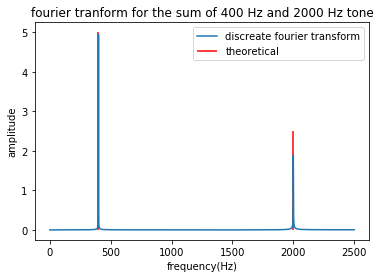

In [5]:
#create a second data with 2000 Hz sampled 5000 times
data_2=5*np.sin(np.linspace(0,2*np.pi*2000, sample_len))

#plot the norm of the non-negative fourier coefficients for the sum of both data scaled by the sample size
plt.plot(np.abs(rfft(data+data_2))/sample_len,label='discreate fourier transform')

#plot two vertical lines. One at 400 from 0 to 5. Oneat 2000 from 0 to 2.5.
plt.vlines([400,2000],0,[5,2.5],color='red',label='theoretical')

#add legend and axis labels
plt.legend()
plt.xlabel('frequency(Hz)')
plt.ylabel('amplitude')
plt.title('fourier tranform for the sum of 400 Hz and 2000 Hz tone')

As you can see, your implementation is pretty slow, because the algorithm scales with $N^2$. Python is providing a full set of *fft*-algorithms. You can exchange your *rfft* function with *np.fft.rfft*, which returns the same values but operates very fast. *np.fft.irfft* is the inverse function. For the next tasks, you can use the functions from the *numpy* module.

To illustrate that these functions do the correct job, the following code example creates a 440Hz tone by setting the appropriate frequency value in the spectrum and calculates the output sequence by using the inverse discrete fourier transformation:

In [6]:
import numpy as np

# the object Audio is a widget, which is able to play sound data
from IPython.display import Audio

samples = 44100*2

# create an empty frequency spectrum
freq = np.zeros((samples//2)+1, dtype=np.complex64)

# create a 440 Hz tone

# calculate the index for the 440 Hz tone, must be an integer!
ind = int(((samples//2)+1) * 440 / 22050)

# sets an amplitude
freq[ind] = 10 + 0j  # the amplitude is abitrary, since Audio is scaling also!

# retransform the data
data = np.fft.irfft(freq)

# play the stream
Audio(data, rate=44100)

## 2. DFT on music data

In this exercise we want to demonstrate the usage of the DTF on a music sample. You can use this player to play the sample:

<audio controls src="file_example_MP3_2MG.mp3" type="audio/mpeg">Your browser does not support the audio tag.</audio>

To analyze this music sample, you can use the following code block, which reads the music into the memory and returns a 2 dimensional *numpy array* (float64) of the unpacked music data:

In [7]:
import loadaudio      # this is for the handling of mp3 files
import numpy as np


song = loadaudio.audiofile('file_example_MP3_2MG.mp3')

data = song.read()     # data has now the music data

print(song.frame_rate)  # prints the frame rate of the file

print(f'The song has {data.shape[0]} samples in {data.shape[1]} tracks, sample rate is {song.frame_rate} kHz')

print(data.dtype)
print(data.min())
print(data.max())
print(data.mean())

print(f'The song has {data.shape[0]} samples in {data.shape[1]} tracks, sample rate is {song.frame_rate} kHz')

44100
The song has 2327806 samples in 2 tracks, sample rate is 44100 kHz
float64
-30790.0
32210.0
-0.047434580029435444
The song has 2327806 samples in 2 tracks, sample rate is 44100 kHz


The data is stored in a normal *numpy array* and has 2327806 samples in two tracks. The format of the array is float64 and the values are ranging from -32768 up to 32767 according to signed 16bit integer values. However we only want to analyze only one track, so we can combine both tracks into a *mono* track using the the mean of the tracks:

In [8]:
music_data = (data[:,0]+data[:,1])/2.    # mean of the two tracks

Plotting music data is sometimes not trivial, because you cannot see something in this large plot. For this example we simply plot the values of the first 2000 samples of the music, which are the first 45 milliseconds:

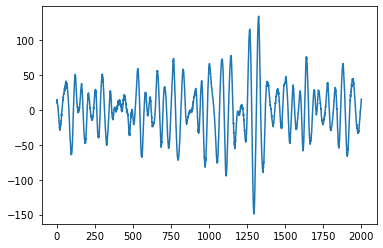

In [9]:
%matplotlib inline 

import matplotlib.pyplot as plt
import numpy as np

limit = 2000
x = np.arange(limit)
plt.plot(x, music_data[:limit])
plt.show()

As you can see the music can be described as a periodical signal. The $y$ range for this small part is pretty small, since the audio signla is quiet.

## Task 2. Plotting the frequency spectrum (10 Points)

**Your task**:

Use the free MP3 file in the directory of this notebook *file_example_MP3_2MG.mp3* which you should read and then calculate the fourier spectrum. Check if the $X_0$ coefficient is correct by analyzing the input data. Plot the fourier spectrum.

**Hints**:
 * for a better analysis you should down scale the fourier coefficients by the number of input data
 * use proper labels for the ticks on the $x$ axis, e.g. ever 4410 Hz


-110418.5
(-110418.5+0j)


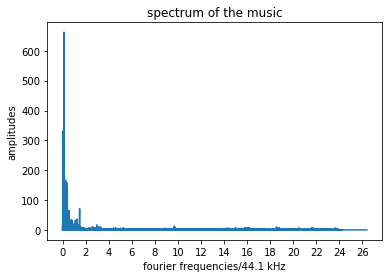

In [10]:
%matplotlib inline

import loadaudio      # this is for the handling of mp3 files
import numpy as np

import matplotlib.pyplot as plt

song = loadaudio.audiofile('file_example_MP3_2MG.mp3')

data = song.read()     # data has now the music data

music_data = (data[:,0]+data[:,1])/2.    # mean of the two tracks

# YOUR CODE HERE

#non-negative fourier coefficents of the music data
fourier_coeff=np.fft.rfft(music_data)

#plot the norm of the coefficients scaled by th length of the data
plt.plot(np.abs(fourier_coeff)/len(music_data))

#change the ticks of the x axis to be multiples of the sample rate 44.1 kHz
x_ticks=np.arange(0,len(fourier_coeff),44100*2)
x_labels=(x_ticks/44100.).astype(int)
plt.xticks(x_ticks,x_labels)

#add x and y labels
plt.xlabel('fourier frequencies/44.1 kHz')
plt.ylabel('amplitudes')

#add title
plt.title('spectrum of the music')

#check that the first coefficient X_0 is correct

#sum of the input
print(np.sum(music_data))

#calculated X_0
print(fourier_coeff[0])

## Task 3. Filtering the data (15 Points)

Filtering signals can be done easily on a fourier spectrum. We want to use some simple filter functions which you may probably know:
 * low pass filter , all frequencies $f$ will pass until a certain frequency $f_l$
 * high pass filter, all frequencies $f$ will pass which are larger the a certain frequency $f_h$
 * band pass filter, all frequencies $f$ between the frequencies $f_l \le f \le f_h$ will pass
 
Passing a frequency means that the value in the fourier spectrum will be untouched, all other frequencies will be set to Zero!

**Your task**:

Write 3 cells in which you implement a low pass filter with $f_l = 440$ Hz, a high pass filter with $f_h = 400$ Hz and a band pass filter with $f_l = 440$Hz and $f_h= 880$Hz. Create a new audio data stream and an Audio-widget for listening!

**Hints**:

Since the audio widget automatically scales the output stream, you don't need to rescale the fourier coefficients before using the inverse fourier transformation!

In [11]:
import loadaudio      # this is for the handling of mp3 files
import numpy as np
from IPython.display import Audio


song = loadaudio.audiofile('file_example_MP3_2MG.mp3')

data = song.read()     # data has now the music data

music_data = (data[:,0]+data[:,1])/2.    # mean of the two tracks

# YOUR CODE HERE

#fourier transform the music
fourier=np.fft.rfft(music_data)

#calculate the index for the frequency 440 Hz
ind=np.int(440*len(music_data)/44100)

#set all frequencies higher than this to 0
fourier[ind:]=0

#inverse fourier transform
low_pass=np.fft.irfft(fourier)

#play audio with a low pass filter
Audio(low_pass, rate=44100)

In [12]:
import loadaudio      # this is for the handling of mp3 files
import numpy as np
from IPython.display import Audio


song = loadaudio.audiofile('file_example_MP3_2MG.mp3')

data = song.read()     # data has now the music data

music_data = (data[:,0]+data[:,1])/2.    # mean of the two tracks

# YOUR CODE HERE

#fourier transform the music
fourier=np.fft.rfft(music_data)

#calculate the index for the frequency 400 Hz
ind=np.int(400*len(music_data)/44100)

#set all frequencies lower than this to 0
fourier[:ind]=0

#inverse fourier transform
high_pass=np.fft.irfft(fourier)

#play audio with a high pass
Audio(high_pass, rate=44100)

In [13]:
import loadaudio      # this is for the handling of mp3 files
import numpy as np
from IPython.display import Audio


song = loadaudio.audiofile('file_example_MP3_2MG.mp3')

data = song.read()     # data has now the music data

music_data = (data[:,0]+data[:,1])/2.    # mean of the two tracks

# YOUR CODE HERE

#fourier transform the music
fourier=np.fft.rfft(music_data)

#calculate the index for frenquency 440 Hz and 880 Hz
ind_low=np.int(440*len(music_data)/44100)
ind_high=np.int(880*len(music_data)/44100)

#set all frequencies outside of this region to 0
fourier[:ind_low]=0
fourier[ind_high:]=0

#inverse fourier transform
band_pass=np.fft.irfft(fourier)

#play audio with a band pass
Audio(band_pass, rate=44100)

## Task 4. Animation of the frequency spectrum (20 Points)

The last task of this exercise is a related to visualization of the frequency spectrum of a music sequence. Calculation of the frequency spectrum is originally defined for periodical signals from the beginning until the end of the sequence. However, a music song will never fulfill this condition. However, if we split the whole sequence into smaller sequences, the periodical signals are more likely available in these sequences. For each of these so called windows we can do a individual fourier transformation and putting the frequency spectra together we can then analyze the changes of frequencies over time. This you probably know from equalizers of your stereo at home. However, the fourier spectrum of the whole song gives you a very fine frequency resolution, the analysis of the smaller windows have, of course, the same frequency range but a poorer frequency resolution. 

Also from theory simply splitting the whole sequence into smaller windows has some problems which we don't want to go into detail. One is that the hard cuts at the beginning and the end of the window leads to some unwanted frequency amplitudes in the fourier spectrum. This can be avoided by:
 * using overlapping windows, which enlarge the size for a specific window
 * using a window function, which leads to a soft lead in and lead out, examples are the Hann, Hamming windows, which are based on a periodical functions
 
**Your task:**

Use the same free MP3 file *file_example_MP3_2MG.mp3* and write an animation which uses the windowing technique in combination with the Hann windowing function. You can use the following recipe:

 1. Define a function *wrfft* which takes the number of the window and the sequence $x$ and the size of the window. It should return the fourier spectrum of this specific window.
 2. read the data from the file
 3. write a loop of the first 200 overlapping windows in which you do a simple animation of the fourier spectrum. Use *clear_output(wait=True)* for clearing the widget before each plot
 

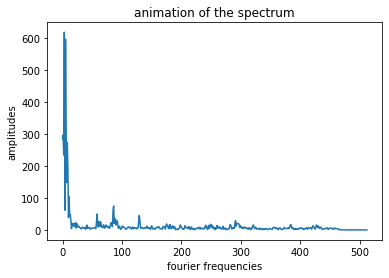

In [14]:
%matplotlib inline 

from IPython.display import clear_output
import matplotlib.pyplot as plt
import numpy as np

import loadaudio      # this is for the handling of mp3 files

#define a function which takes the number of window, the signal and the framesize and return the non-negative fourier coefficients of that window
def wrfft(nr, signal, framesize):
    
    # YOUR CODE HERE
    
    #calculate the Hann window function for this framesize
    window=np.hanning(framesize)
    
    #assume an overlap of 50%
    overlap=0.5
    
    #find the lower and upper index for our window number
    low=np.int(nr*(1-overlap)*framesize)
    up=low+framesize
    
    #fourier transform this specific window shaped by the Hann window function
    fourier=np.fft.rfft(window*signal[low:up])
    
    return fourier
    
#load the audio file   
song = loadaudio.audiofile('file_example_MP3_2MG.mp3')

#read the audio file into a 2-d array
data = song.read()     

#mean of the two tracks
music_data = (data[:,0]+data[:,1])/2.   

#define the framesize
size=1024

#loop 200 times to create an animation
for i in range(200):
    
    #call the function using 1024 as the frame size
    fourier=wrfft(i,music_data,size)
    
    #clear output every time 
    clear_output(wait=True)
    
    #create a figure
    plt.figure()
    
    #plot norm of fourier coefficients scaled by the frame size
    plt.plot(np.abs(fourier)/size)

    #add x and y labels
    plt.xlabel('fourier frequencies')
    plt.ylabel('amplitudes')

    #add title
    plt.title('animation of the spectrum')

    #show plot
    plt.show()

## Notice:

For this exercise we are using some audio files, which are not free. Since we are using the files for lecture purposes, I guess that is legal. But please don't publish these file on the internet. It is for this exercise only!